In [1]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html


In [2]:
import detectron2
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
import cv2
import time
import glob
import matplotlib.pyplot as plt 

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.WEIGHTS = 'weight/model_final.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.DEVICE = 'cpu'

predictor = DefaultPredictor(cfg)
TEST_PATH = 'pig/test/*'

Time: 4.205545425415039


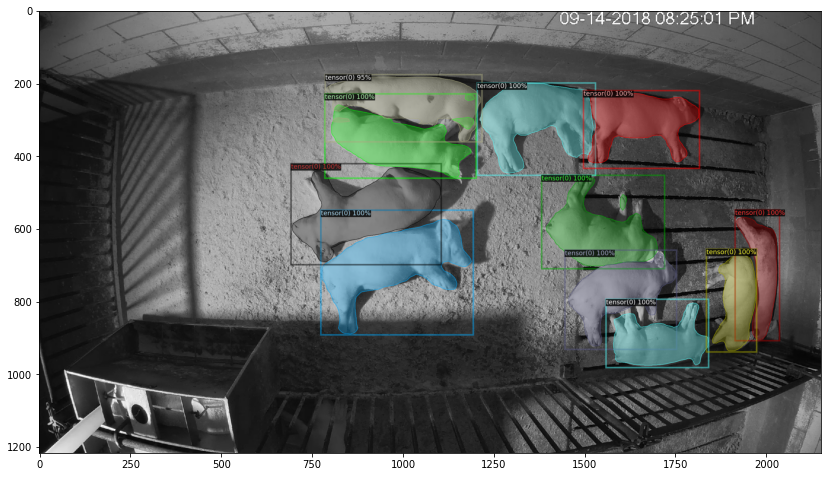

Time: 4.582350254058838


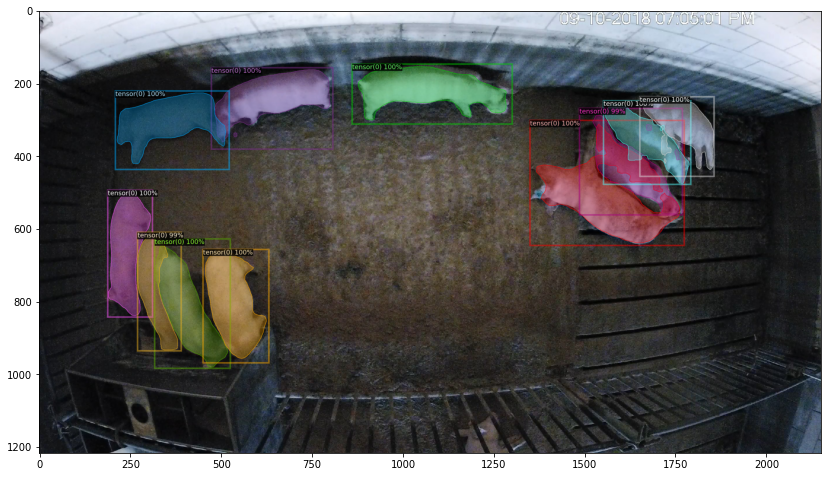

Time: 4.366708040237427


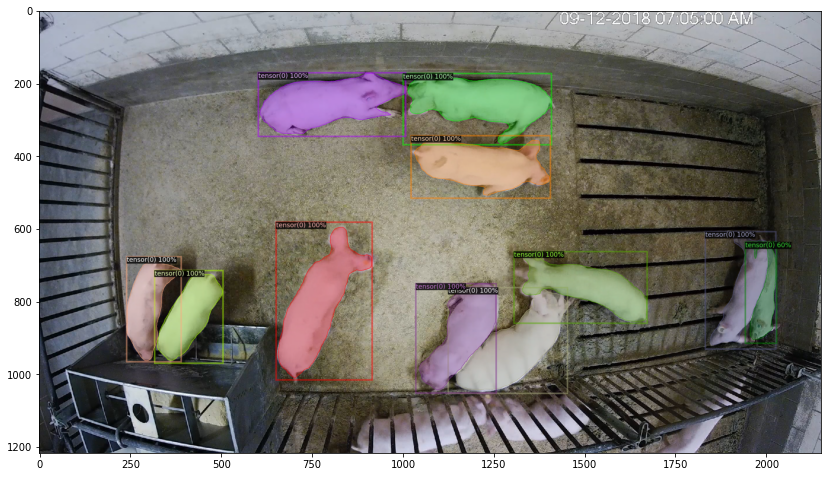

Time: 4.41724157333374


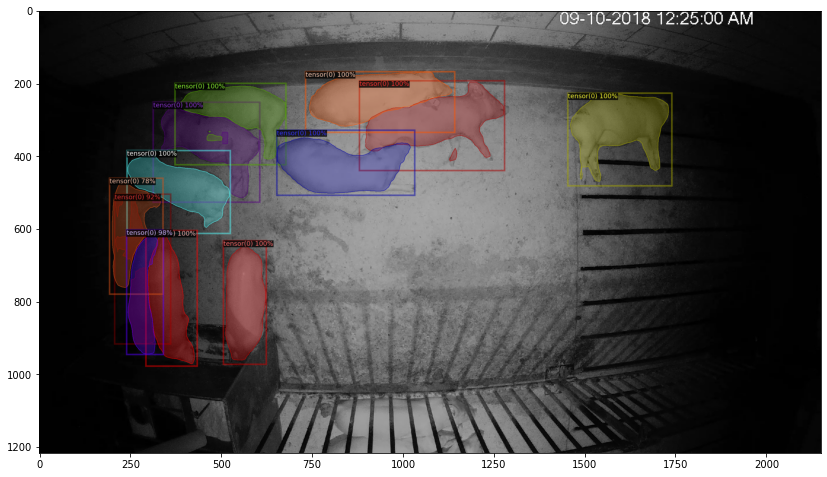

Time: 4.52094841003418


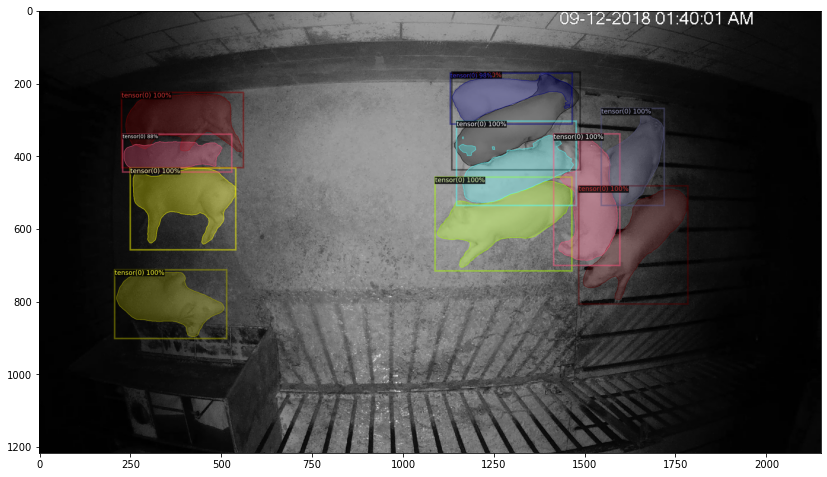

Time: 4.68064022064209


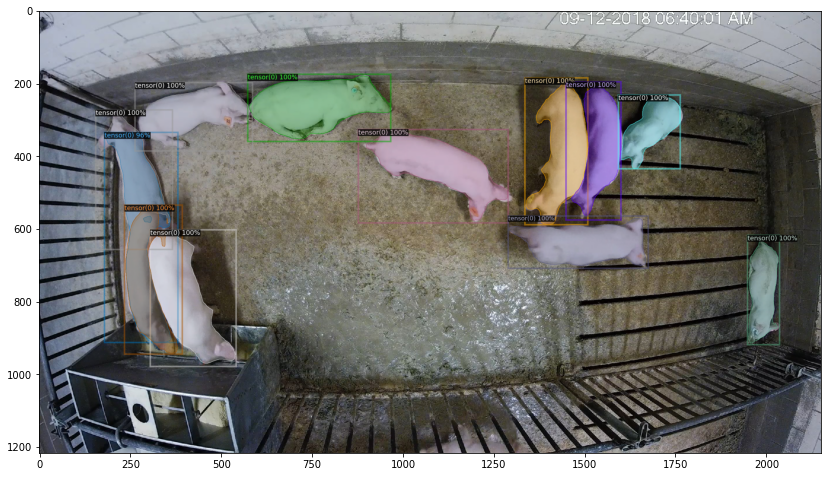

Time: 4.795612096786499


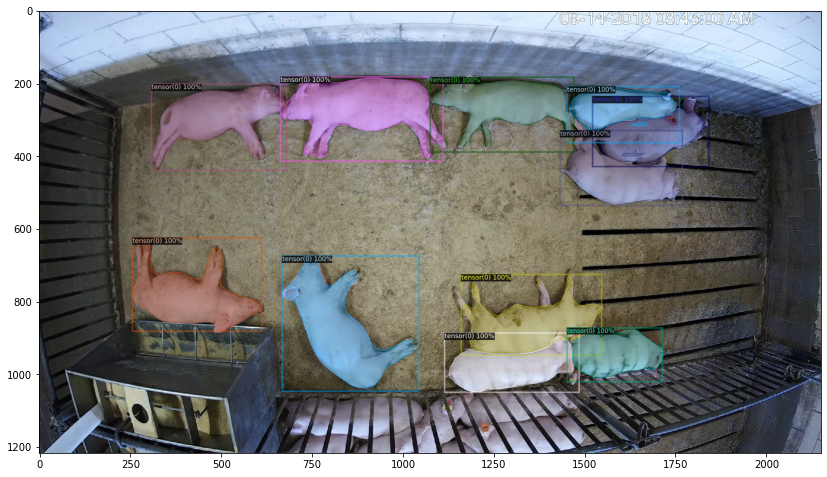

Time: 4.479056119918823


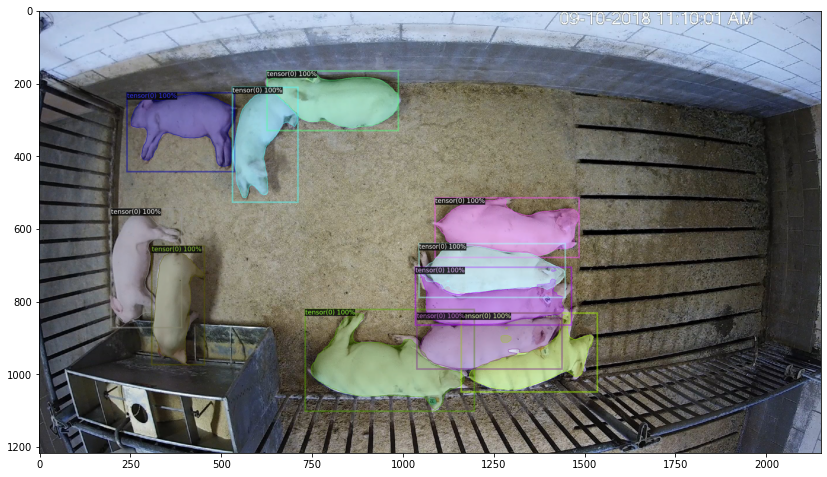

Time: 4.829681158065796


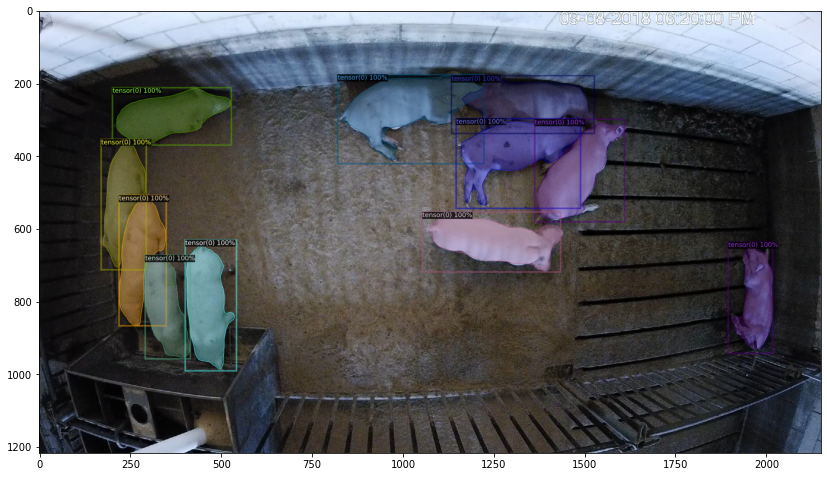

Time: 4.446924686431885


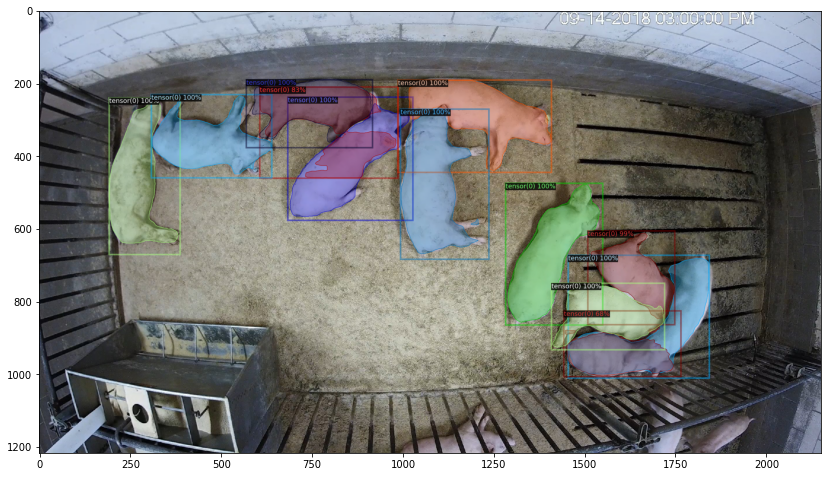

Time: 4.781522989273071


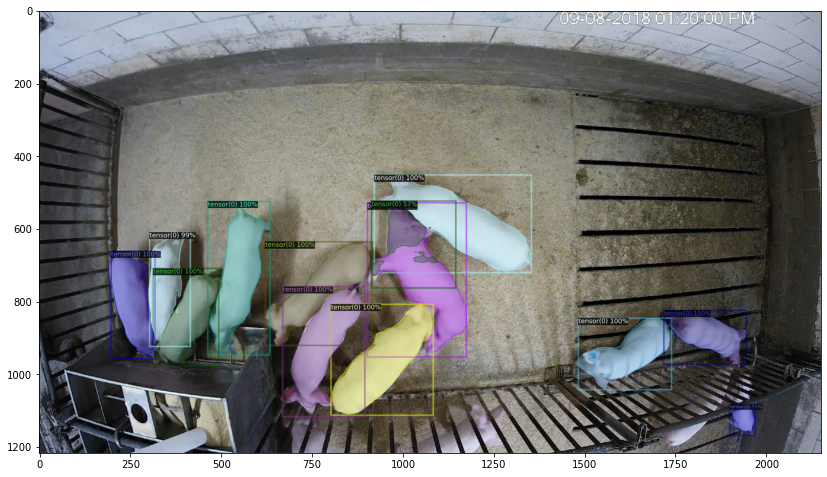

Time: 4.8393402099609375


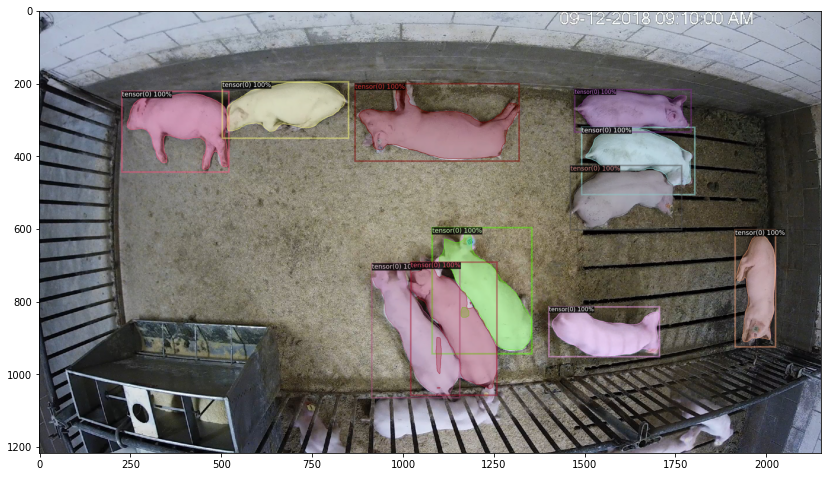

Time: 4.7133567333221436


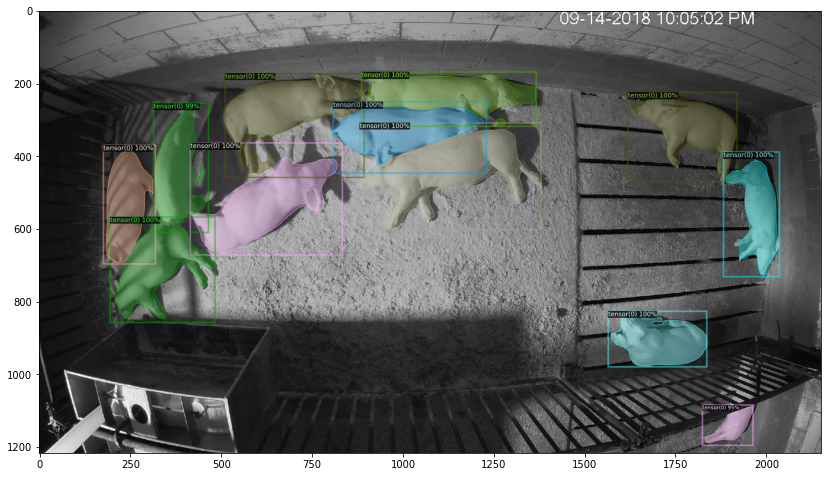

Time: 4.673978328704834


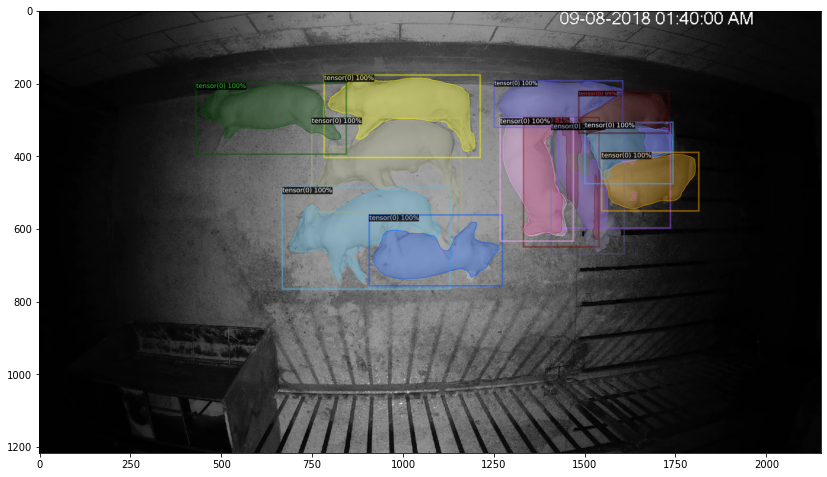

In [3]:
for d in glob.glob(TEST_PATH):
    im = cv2.imread(d)
    start = time.time()
    outputs = predictor(im)
    print("Time: " + str(time.time() - start))
    v = Visualizer(im[:, :, ::-1],
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()